In [ ]:
from google.colab import drive
drive.mount ('/content/drive')

Mounted at /content/drive


# **1) Transformée de Fourrier:**

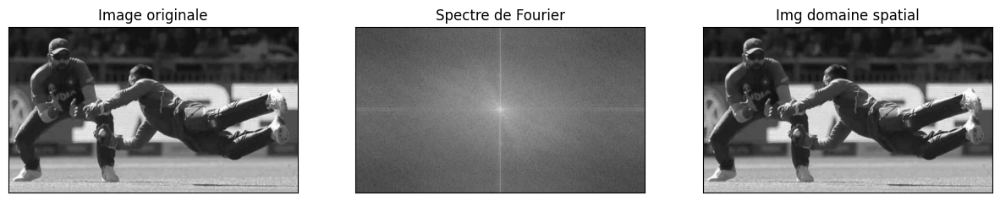

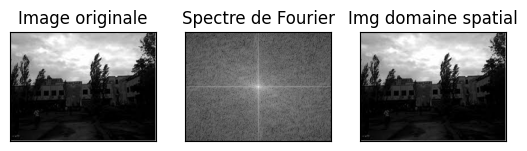

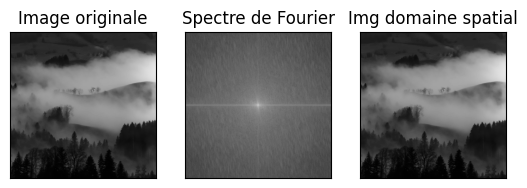

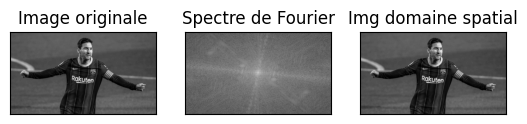

In [ ]:
from google.colab.patches import cv2_imshow
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Chemins vers les images
image_paths = [
    '/content/drive/MyDrive/dataImage/Fourier1.JPG',
    '/content/drive/MyDrive/dataImage/images5.JPG',
    '/content/drive/MyDrive/dataImage/images6.JPG',
    '/content/drive/MyDrive/dataImage/fourier2.JPG'
]

# Créez une figure pour afficher les images horizontalement
plt.figure(figsize=(15, 5))

for image_path in image_paths:
    # Charger l'image depuis Google Drive
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

    # Calculer la transformation de Fourier
    fourier_transform = np.fft.fft2(image)
    fourier_transform_shifted = np.fft.fftshift(fourier_transform)
    spectrum = np.abs(fourier_transform_shifted)

    # Calculer la transformation de Fourier inverse
    inverse_fourier_transform = np.fft.ifft2(np.fft.ifftshift(fourier_transform_shifted))

    # Afficher l'image originale
    plt.subplot(131)
    plt.imshow(image, cmap='gray')
    plt.title('Image originale')
    plt.xticks([]), plt.yticks([])

    # Afficher le spectre de Fourier
    plt.subplot(132)
    plt.imshow(np.log(1 + spectrum), cmap='gray')
    plt.title('Spectre de Fourier')
    plt.xticks([]), plt.yticks([])

    # Afficher l'image dans le domaine spatial
    plt.subplot(133)
    plt.imshow(np.abs(inverse_fourier_transform), cmap='gray')
    plt.title('Img domaine spatial')
    plt.xticks([]), plt.yticks([])

    # Afficher la figure courante
    plt.show()


# **2) Filtres pass-bas et filtre pass-haut**

<ipython-input-4-9c6e16c88665>:34: RuntimeWarning: divide by zero encountered in log
  magnitude_spectrum_highpass = 20 * np.log(cv2.magnitude(dft_shift_highpass[:, :, 0], dft_shift_highpass[:, :, 1]))
<ipython-input-4-9c6e16c88665>:65: RuntimeWarning: divide by zero encountered in log
  magnitude_spectrum_lowpass = 20 * np.log(cv2.magnitude(dft_shift_lowpass[:, :, 0], dft_shift_lowpass[:, :, 1]))


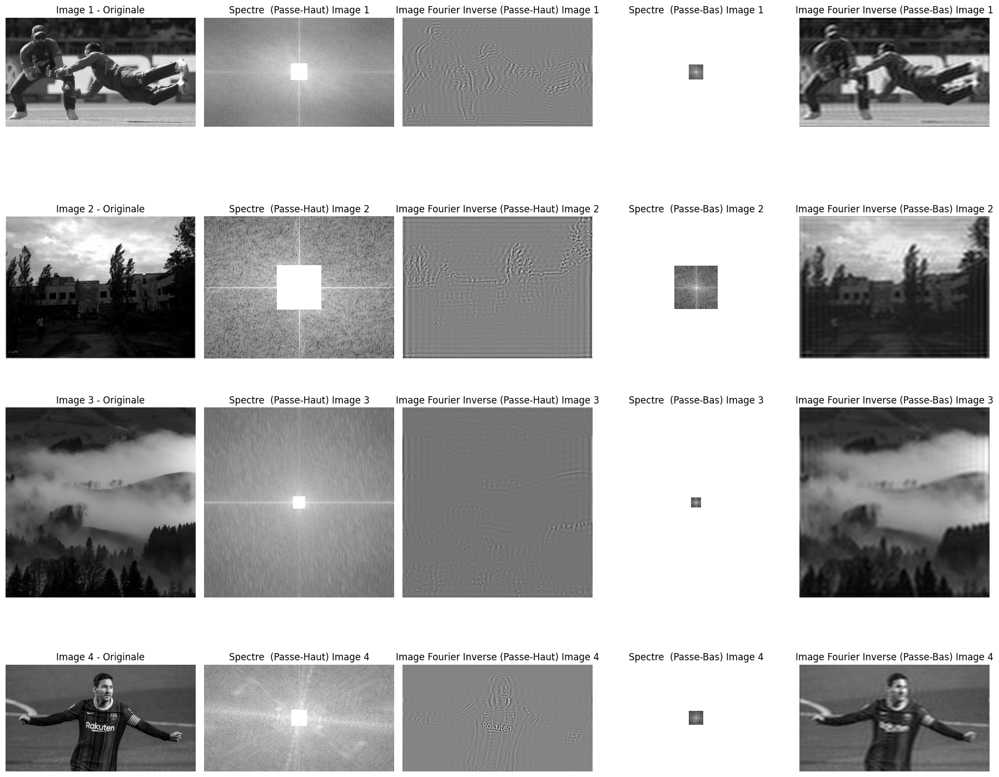

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Chemins vers les quatre images
image_paths = [
    '/content/drive/MyDrive/dataImage/Fourier1.JPG',
    '/content/drive/MyDrive/dataImage/images5.JPG',
    '/content/drive/MyDrive/dataImage/images6.JPG',
    '/content/drive/MyDrive/dataImage/fourier2.JPG'
]

# Fonction pour appliquer un filtre passe-haut
def apply_high_pass_filter(image):
    # Convertir l'image en float32
    image_float32 = np.float32(image)

    # Appliquer la transformée de Fourier sur l'image
    dft = cv2.dft(image_float32, flags=cv2.DFT_COMPLEX_OUTPUT)

    # Transférer le zéro-fréquent au centre de la transformée
    dft_shift = np.fft.fftshift(dft)

    # Créer un masque pour le filtre passe-haut
    rows, cols = image.shape
    crow, ccol = rows // 2, cols // 2
    mask_highpass = np.ones((rows, cols, 2), np.uint8)
    mask_highpass[crow - 30:crow + 30, ccol - 30:ccol + 30] = 0

    # Appliquer le masque passe-haut à la transformée de Fourier
    dft_shift_highpass = dft_shift * mask_highpass

    # Calculer le spectre de magnitude (magnitude du spectre complexe) du filtre passe-haut
    magnitude_spectrum_highpass = 20 * np.log(cv2.magnitude(dft_shift_highpass[:, :, 0], dft_shift_highpass[:, :, 1]))

    # Appliquer la transformée de Fourier inverse pour obtenir l'image filtrée
    img_back_highpass = cv2.idft(np.fft.ifftshift(dft_shift_highpass))

    # Obtenir la composante réelle de l'image inverse
    img_back_highpass = img_back_highpass[:, :, 0]

    return magnitude_spectrum_highpass, img_back_highpass

# Fonction pour appliquer un filtre passe-bas
def apply_low_pass_filter(image):
    # Convertir l'image en float32
    image_float32 = np.float32(image)

    # Appliquer la transformée de Fourier sur l'image
    dft = cv2.dft(image_float32, flags=cv2.DFT_COMPLEX_OUTPUT)

    # Transférer le zéro-fréquent au centre de la transformée
    dft_shift = np.fft.fftshift(dft)

    # Créer un masque pour le filtre passe-bas
    rows, cols = image.shape
    crow, ccol = rows // 2, cols // 2
    mask_lowpass = np.zeros((rows, cols, 2), np.uint8)
    mask_lowpass[crow - 30:crow + 30, ccol - 30:ccol + 30] = 1

    # Appliquer le masque passe-bas à la transformée de Fourier
    dft_shift_lowpass = dft_shift * mask_lowpass

    # Calculer le spectre de magnitude (magnitude du spectre complexe) du filtre passe-bas
    magnitude_spectrum_lowpass = 20 * np.log(cv2.magnitude(dft_shift_lowpass[:, :, 0], dft_shift_lowpass[:, :, 1]))

    # Appliquer la transformée de Fourier inverse pour obtenir l'image filtrée
    img_back_lowpass = cv2.idft(np.fft.ifftshift(dft_shift_lowpass))

    # Obtenir la composante réelle de l'image inverse
    img_back_lowpass = img_back_lowpass[:, :, 0]

    return magnitude_spectrum_lowpass, img_back_lowpass

# Appliquer les filtres et afficher les résultats
plt.figure(figsize=(18, 16))
for i, image_path in enumerate(image_paths):
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

    plt.subplot(4, 5, i * 5 + 1)
    plt.imshow(image, cmap='gray')
    plt.title(f'Image {i + 1} - Originale')
    plt.axis('off')

    # Appliquer le filtre passe-haut
    magnitude_spectrum_highpass, img_back_highpass = apply_high_pass_filter(image)

    plt.subplot(4, 5, i * 5 + 2)
    plt.imshow(magnitude_spectrum_highpass, cmap='gray')
    plt.title(f'Spectre  (Passe-Haut) Image {i + 1}')
    plt.axis('off')

    plt.subplot(4, 5, i * 5 + 3)
    plt.imshow(img_back_highpass, cmap='gray')
    plt.title(f'Image Fourier Inverse (Passe-Haut) Image {i + 1}')
    plt.axis('off')

    # Appliquer le filtre passe-bas
    magnitude_spectrum_lowpass, img_back_lowpass = apply_low_pass_filter(image)

    plt.subplot(4, 5, i * 5 + 4)
    plt.imshow(magnitude_spectrum_lowpass, cmap='gray')
    plt.title(f'Spectre  (Passe-Bas) Image {i + 1}')
    plt.axis('off')

    plt.subplot(4, 5, i * 5 + 5)
    plt.imshow(img_back_lowpass, cmap='gray')
    plt.title(f'Image Fourier Inverse (Passe-Bas) Image {i + 1}')
    plt.axis('off')

plt.tight_layout()
plt.show()


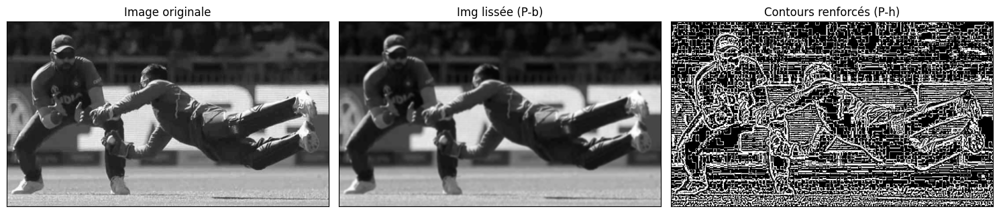

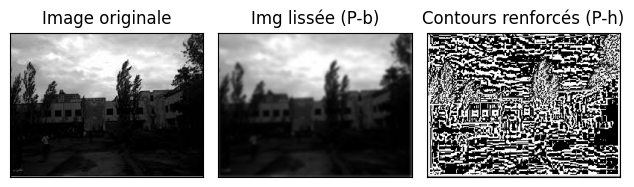

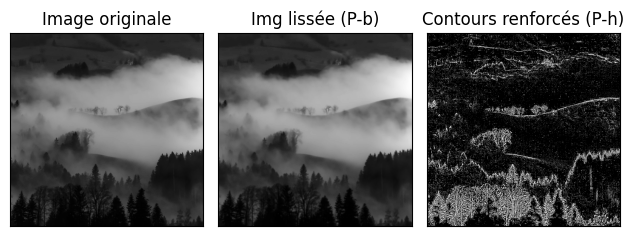

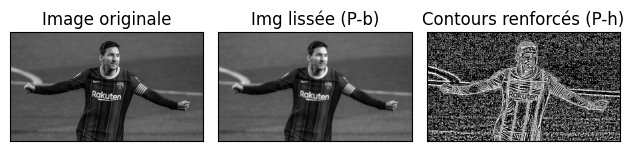

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Chemins vers les images
image_paths = [
    '/content/drive/MyDrive/dataImage/Fourier1.JPG',
    '/content/drive/MyDrive/dataImage/images5.JPG',
    '/content/drive/MyDrive/dataImage/images6.JPG',
    '/content/drive/MyDrive/dataImage/fourier2.JPG'
]

# Créez une figure pour afficher les images horizontalement
plt.figure(figsize=(15, 5))

for image_path in image_paths:
    # Charger l'image depuis Google Drive
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

    # Appliquer un filtre passe-bas pour lisser l'image
    blurred_image = cv2.GaussianBlur(image, (7, 7), 0)

    # Appliquer un filtre passe-haut (contours) en soustrayant l'image lissée de l'image originale
    high_pass_image = image - blurred_image

    # Afficher les images originales, les images lissées (passe-bas) et les contours renforcés (passe-haut)
    plt.subplot(131)
    plt.imshow(image, cmap='gray')
    plt.title('Image originale')
    plt.xticks([]), plt.yticks([])

    plt.subplot(132)
    plt.imshow(blurred_image, cmap='gray')
    plt.title('Img lissée (P-b)')
    plt.xticks([]), plt.yticks([])

    plt.subplot(133)
    plt.imshow(high_pass_image, cmap='gray')
    plt.title('Contours renforcés (P-h)')
    plt.xticks([]), plt.yticks([])

    # Afficher la figure courante
    plt.tight_layout()
    plt.show()


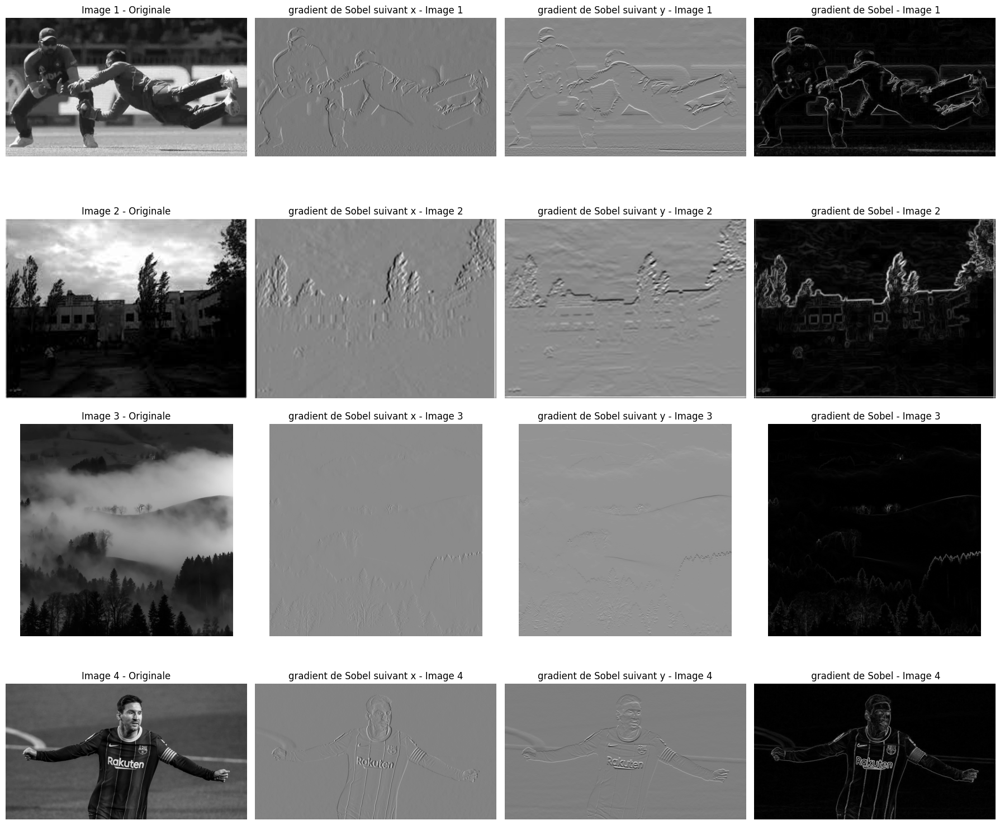

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Chemins vers les 4 images
image_paths = [
    '/content/drive/MyDrive/dataImage/Fourier1.JPG',
    '/content/drive/MyDrive/dataImage/images5.JPG',
    '/content/drive/MyDrive/dataImage/images6.JPG',
    '/content/drive/MyDrive/dataImage/fourier2.JPG'
]

# Fonction pour appliquer un filtre Sobel
def apply_sobel_filter(image):
    # Appliquer le filtre de Sobel en x et y
    sobel_x = cv2.Sobel(image, cv2.CV_64F, 1, 0, ksize=3)
    sobel_y = cv2.Sobel(image, cv2.CV_64F, 0, 1, ksize=3)

    # Calculer le module du gradient
    magnitude = np.sqrt(sobel_x**2 + sobel_y**2)

    return sobel_x, sobel_y, magnitude

# Appliquer le filtre Sobel à chaque image et afficher les résultats
plt.figure(figsize=(18, 16))
for i, image_path in enumerate(image_paths):
    # Charger l'image depuis le chemin d'accès
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

    # Appliquer le filtre Sobel
    sobel_x, sobel_y, magnitude = apply_sobel_filter(image)

    # Afficher les résultats
    plt.subplot(4, 4, i * 4 + 1)
    plt.imshow(image, cmap='gray')
    plt.title(f'Image {i + 1} - Originale')
    plt.axis('off')

    plt.subplot(4, 4, i * 4 + 2)
    plt.imshow(sobel_x, cmap='gray')
    plt.title(f'gradient de Sobel suivant x - Image {i + 1}')
    plt.axis('off')

    plt.subplot(4, 4, i * 4 + 3)
    plt.imshow(sobel_y, cmap='gray')
    plt.title(f'gradient de Sobel suivant y - Image {i + 1}')
    plt.axis('off')

    plt.subplot(4, 4, i * 4 + 4)
    plt.imshow(magnitude, cmap='gray')
    plt.title(f' gradient de Sobel - Image {i + 1}')
    plt.axis('off')

plt.tight_layout()
plt.show()


<ipython-input-7-9637f8fbcc32>:49: RuntimeWarning: divide by zero encountered in log
  magnitude_spectrum_highpass = 20 * np.log(cv2.magnitude(dft_shift_highpass[:, :, 0], dft_shift_highpass[:, :, 1]))
<ipython-input-7-9637f8fbcc32>:80: RuntimeWarning: divide by zero encountered in log
  magnitude_spectrum_lowpass = 20 * np.log(cv2.magnitude(dft_shift_lowpass[:, :, 0], dft_shift_lowpass[:, :, 1]))


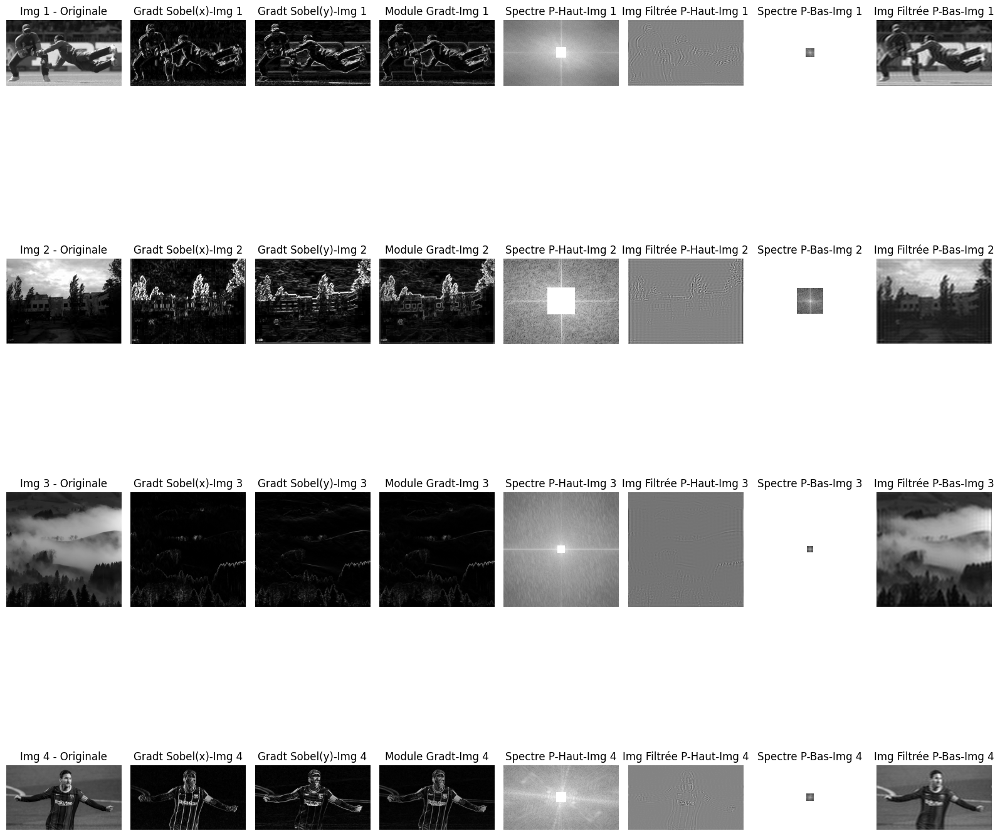

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Chemins vers les quatre images
image_paths = [
    '/content/drive/MyDrive/dataImage/Fourier1.JPG',
    '/content/drive/MyDrive/dataImage/images5.JPG',
    '/content/drive/MyDrive/dataImage/images6.JPG',
    '/content/drive/MyDrive/dataImage/fourier2.JPG'
]

# Fonction pour appliquer un filtre Sobel
def apply_sobel_filter(image):
    # Appliquer le filtre Sobel en x
    sobel_x = cv2.Sobel(image, cv2.CV_64F, 1, 0, ksize=3)
    sobel_x = cv2.convertScaleAbs(sobel_x)

    # Appliquer le filtre Sobel en y
    sobel_y = cv2.Sobel(image, cv2.CV_64F, 0, 1, ksize=3)
    sobel_y = cv2.convertScaleAbs(sobel_y)

    # Calculer le module du gradient
    magnitude = cv2.addWeighted(sobel_x, 0.5, sobel_y, 0.5, 0)

    return sobel_x, sobel_y, magnitude

# Fonction pour appliquer un filtre passe-haut
def apply_high_pass_filter(image):
    # Convertir l'image en float32
    image_float32 = np.float32(image)

    # Appliquer la transformée de Fourier sur l'image
    dft = cv2.dft(image_float32, flags=cv2.DFT_COMPLEX_OUTPUT)

    # Transférer le zéro-fréquent au centre de la transformée
    dft_shift = np.fft.fftshift(dft)

    # Créer un masque pour le filtre passe-haut
    rows, cols = image.shape
    crow, ccol = rows // 2, cols // 2
    mask_highpass = np.ones((rows, cols, 2), np.uint8)
    mask_highpass[crow - 30:crow + 30, ccol - 30:ccol + 30] = 0

    # Appliquer le masque passe-haut à la transformée de Fourier
    dft_shift_highpass = dft_shift * mask_highpass

    # Calculer le spectre de magnitude (magnitude du spectre complexe) du filtre passe-haut
    magnitude_spectrum_highpass = 20 * np.log(cv2.magnitude(dft_shift_highpass[:, :, 0], dft_shift_highpass[:, :, 1]))

    # Appliquer la transformée de Fourier inverse pour obtenir l'image filtrée
    img_back_highpass = cv2.idft(np.fft.ifftshift(dft_shift_highpass))

    # Obtenir la composante réelle de l'image inverse
    img_back_highpass = img_back_highpass[:, :, 0]

    return magnitude_spectrum_highpass, img_back_highpass

# Fonction pour appliquer un filtre passe-bas
def apply_low_pass_filter(image):
    # Convertir l'image en float32
    image_float32 = np.float32(image)

    # Appliquer la transformée de Fourier sur l'image
    dft = cv2.dft(image_float32, flags=cv2.DFT_COMPLEX_OUTPUT)

    # Transférer le zéro-fréquent au centre de la transformée
    dft_shift = np.fft.fftshift(dft)

    # Créer un masque pour le filtre passe-bas
    rows, cols = image.shape
    crow, ccol = rows // 2, cols // 2
    mask_lowpass = np.zeros((rows, cols, 2), np.uint8)
    mask_lowpass[crow - 30:crow + 30, ccol - 30:ccol + 30] = 1

    # Appliquer le masque passe-bas à la transformée de Fourier
    dft_shift_lowpass = dft_shift * mask_lowpass

    # Calculer le spectre de magnitude (magnitude du spectre complexe) du filtre passe-bas
    magnitude_spectrum_lowpass = 20 * np.log(cv2.magnitude(dft_shift_lowpass[:, :, 0], dft_shift_lowpass[:, :, 1]))

    # Appliquer la transformée de Fourier inverse pour obtenir l'image filtrée
    img_back_lowpass = cv2.idft(np.fft.ifftshift(dft_shift_lowpass))

    # Obtenir la composante réelle de l'image inverse
    img_back_lowpass = img_back_lowpass[:, :, 0]

    return magnitude_spectrum_lowpass, img_back_lowpass

# Appliquer les filtres et afficher les résultats
plt.figure(figsize=(18, 16))
for i, image_path in enumerate(image_paths):
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

    plt.subplot(4, 9, i * 9 + 1)
    plt.imshow(image, cmap='gray')
    plt.title(f'Img {i + 1} - Originale')
    plt.axis('off')

    sobel_x, sobel_y, magnitude = apply_sobel_filter(image)

    plt.subplot(4, 9, i * 9 + 2)
    plt.imshow(sobel_x, cmap='gray')
    plt.title(f'Gradt Sobel(x)-Img {i + 1}')
    plt.axis('off')

    plt.subplot(4, 9, i * 9 + 3)
    plt.imshow(sobel_y, cmap='gray')
    plt.title(f'Gradt Sobel(y)-Img {i + 1}')
    plt.axis('off')

    plt.subplot(4, 9, i * 9 + 4)
    plt.imshow(magnitude, cmap='gray')
    plt.title(f'Module Gradt-Img {i + 1}')
    plt.axis('off')

    magnitude_spectrum_highpass, img_back_highpass = apply_high_pass_filter(image)

    plt.subplot(4, 9, i * 9 + 5)
    plt.imshow(magnitude_spectrum_highpass, cmap='gray')
    plt.title(f'Spectre P-Haut-Img {i + 1}')
    plt.axis('off')

    plt.subplot(4, 9, i * 9 + 6)
    plt.imshow(img_back_highpass, cmap='gray')
    plt.title(f'Img Filtrée P-Haut-Img {i + 1}')
    plt.axis('off')

    magnitude_spectrum_lowpass, img_back_lowpass = apply_low_pass_filter(image)

    plt.subplot(4, 9, i * 9 + 7)
    plt.imshow(magnitude_spectrum_lowpass, cmap='gray')
    plt.title(f'Spectre P-Bas-Img {i + 1}')
    plt.axis('off')

    plt.subplot(4, 9, i * 9 + 8)
    plt.imshow(img_back_lowpass, cmap='gray')
    plt.title(f'Img Filtrée P-Bas-Img {i + 1}')
    plt.axis('off')

plt.tight_layout()
plt.show()


# **3) Filtrer des bruits sinus (optional)**

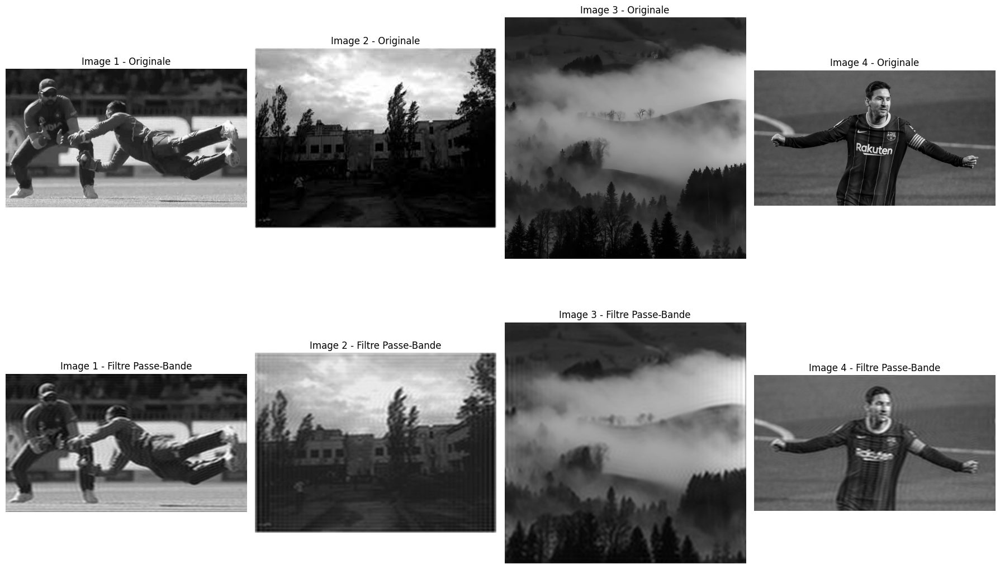

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Chemins vers les quatre images
image_paths = [
    '/content/drive/MyDrive/dataImage/Fourier1.JPG',
    '/content/drive/MyDrive/dataImage/images5.JPG',
    '/content/drive/MyDrive/dataImage/images6.JPG',
    '/content/drive/MyDrive/dataImage/fourier2.JPG'
]

# Fréquence du bruit sinus
frequency = 50  # Vous pouvez ajuster cette fréquence selon votre besoin

# Fonction pour appliquer un filtre passe-bande pour supprimer le bruit sinus
def apply_bandpass_filter(image, frequency):
    # Convertir l'image en float32
    image_float32 = np.float32(image)

    # Appliquer la transformée de Fourier sur l'image
    dft = cv2.dft(image_float32, flags=cv2.DFT_COMPLEX_OUTPUT)

    # Transférer le zéro-fréquent au centre de la transformée
    dft_shift = np.fft.fftshift(dft)

    # Créer un masque pour le filtre passe-bande
    rows, cols = image.shape[:2]  # Correction ici pour obtenir les dimensions correctes
    crow, ccol = rows // 2, cols // 2
    mask_bandpass = np.zeros((rows, cols, 2), np.uint8)
    mask_bandpass[crow - 50: crow + 50, ccol - frequency: ccol + frequency] = 1

    # Appliquer le masque passe-bande à la transformée de Fourier
    dft_shift_bandpass = dft_shift * mask_bandpass

    # Appliquer la transformée de Fourier inverse pour obtenir l'image filtrée
    img_back_bandpass = cv2.idft(np.fft.ifftshift(dft_shift_bandpass))

    # Obtenir la composante réelle de l'image inverse
    img_back_bandpass = img_back_bandpass[:, :, 0]

    return img_back_bandpass

# Afficher les images originales et les images après filtrage
plt.figure(figsize=(18, 12))
for i, image_path in enumerate(image_paths):
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

    # Appliquer le filtre passe-bande
    filtered_image = apply_bandpass_filter(image, frequency)

    plt.subplot(2, 4, i + 1)
    plt.imshow(image, cmap='gray')
    plt.title(f'Image {i + 1} - Originale')
    plt.axis('off')

    plt.subplot(2, 4, i + 5)
    plt.imshow(filtered_image, cmap='gray')
    plt.title(f'Image {i + 1} - Filtre Passe-Bande')
    plt.axis('off')

plt.tight_layout()
plt.show()


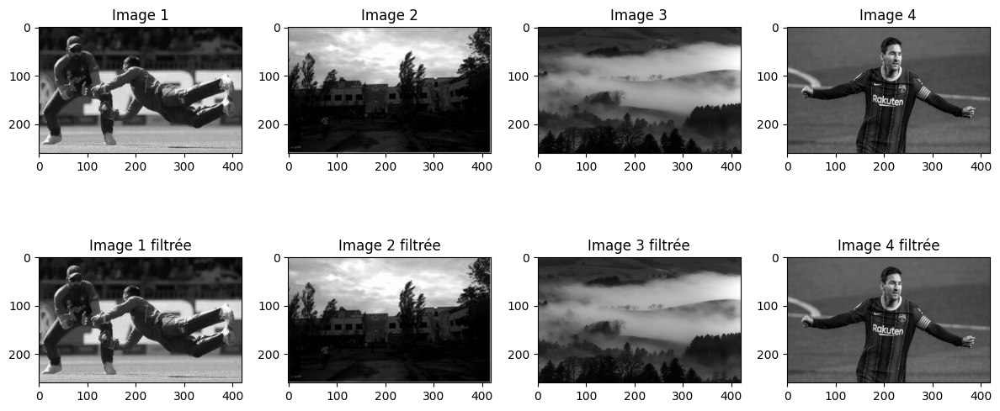

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Charger les quatre images (remplacez les noms de fichiers par les vôtres)
image1 = cv2.imread('/content/drive/MyDrive/dataImage/Fourier1.JPG', cv2.IMREAD_GRAYSCALE)
image2 = cv2.imread('/content/drive/MyDrive/dataImage/images5.JPG', cv2.IMREAD_GRAYSCALE)
image3 = cv2.imread('/content/drive/MyDrive/dataImage/images6.JPG', cv2.IMREAD_GRAYSCALE)
image4 = cv2.imread('/content/drive/MyDrive/dataImage/fourier2.JPG', cv2.IMREAD_GRAYSCALE)

# Redimensionnez les images pour qu'elles aient la même taille
height, width = 260, 419  # Définissez la taille cible pour vos images
image1 = cv2.resize(image1, (width, height))
image2 = cv2.resize(image2, (width, height))
image3 = cv2.resize(image3, (width, height))
image4 = cv2.resize(image4, (width, height))

# Appliquer la transformée de Fourier à chaque image
f1 = np.fft.fft2(image1)
f2 = np.fft.fft2(image2)
f3 = np.fft.fft2(image3)
f4 = np.fft.fft2(image4)

# Créer un masque pour supprimer les fréquences indésirables (bruits sinus)
# Vous pouvez ajuster ce masque en fonction de vos besoins
rows, cols = f1.shape
crow, ccol = rows // 2, cols // 2
mask = np.ones((rows, cols), np.uint8)
mask[crow - 30:crow + 30, ccol - 30:ccol + 30] = 0

# Appliquer le masque aux transformées de Fourier
f1_filtered = f1 * mask
f2_filtered = f2 * mask
f3_filtered = f3 * mask
f4_filtered = f4 * mask

# Effectuer l'inverse de la transformée de Fourier pour obtenir les images filtrées
image1_filtered = np.fft.ifft2(f1_filtered).real
image2_filtered = np.fft.ifft2(f2_filtered).real
image3_filtered = np.fft.ifft2(f3_filtered).real
image4_filtered = np.fft.ifft2(f4_filtered).real

# Afficher les images originales et les versions filtrées
plt.figure(figsize=(12, 6))
plt.subplot(241), plt.imshow(image1, cmap='gray'), plt.title('Image 1')
plt.subplot(242), plt.imshow(image2, cmap='gray'), plt.title('Image 2')
plt.subplot(243), plt.imshow(image3, cmap='gray'), plt.title('Image 3')
plt.subplot(244), plt.imshow(image4, cmap='gray'), plt.title('Image 4')

plt.subplot(245), plt.imshow(image1_filtered, cmap='gray'), plt.title('Image 1 filtrée')
plt.subplot(246), plt.imshow(image2_filtered, cmap='gray'), plt.title('Image 2 filtrée')
plt.subplot(247), plt.imshow(image3_filtered, cmap='gray'), plt.title('Image 3 filtrée')
plt.subplot(248), plt.imshow(image4_filtered, cmap='gray'), plt.title('Image 4 filtrée')

plt.tight_layout()
plt.show()


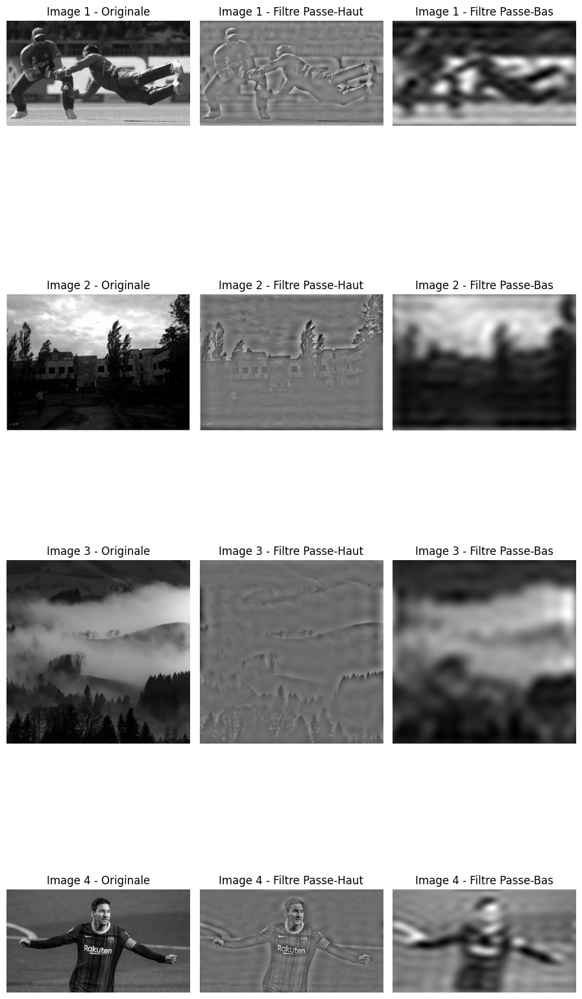

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Chemins vers les quatre images
image_paths = [
    '/content/drive/MyDrive/dataImage/Fourier1.JPG',
    '/content/drive/MyDrive/dataImage/images5.JPG',
    '/content/drive/MyDrive/dataImage/images6.JPG',
    '/content/drive/MyDrive/dataImage/fourier2.JPG'
]

# Fréquence du bruit sinus
frequency = 10  # Vous pouvez ajuster cette fréquence selon votre besoin

# Fonction pour appliquer un filtre passe-haut pour supprimer le bruit sinus
def apply_high_pass_filter(image, frequency):
    # Convertir l'image en float32
    image_float32 = np.float32(image)

    # Appliquer la transformée de Fourier sur l'image
    dft = cv2.dft(image_float32, flags=cv2.DFT_COMPLEX_OUTPUT)

    # Transférer le zéro-fréquent au centre de la transformée
    dft_shift = np.fft.fftshift(dft)

    # Créer un masque pour le filtre passe-haut
    rows, cols = image.shape[:2]  # Correction ici pour obtenir les dimensions correctes
    crow, ccol = rows // 2, cols // 2
    mask_highpass = np.ones((rows, cols, 2), np.uint8)
    mask_highpass[crow - frequency: crow + frequency, ccol - frequency: ccol + frequency] = 0

    # Appliquer le masque passe-haut à la transformée de Fourier
    dft_shift_highpass = dft_shift * mask_highpass

    # Appliquer la transformée de Fourier inverse pour obtenir l'image filtrée
    img_back_highpass = cv2.idft(np.fft.ifftshift(dft_shift_highpass))

    # Obtenir la composante réelle de l'image inverse
    img_back_highpass = img_back_highpass[:, :, 0]

    return img_back_highpass

# Fonction pour appliquer un filtre passe-bas pour conserver les basses fréquences
def apply_low_pass_filter(image, frequency):
    # Convertir l'image en float32
    image_float32 = np.float32(image)

    # Appliquer la transformée de Fourier sur l'image
    dft = cv2.dft(image_float32, flags=cv2.DFT_COMPLEX_OUTPUT)

    # Transférer le zéro-fréquent au centre de la transformée
    dft_shift = np.fft.fftshift(dft)

    # Créer un masque pour le filtre passe-bas
    rows, cols = image.shape[:2]  # Correction ici pour obtenir les dimensions correctes
    crow, ccol = rows // 2, cols // 2
    mask_lowpass = np.zeros((rows, cols, 2), np.uint8)
    mask_lowpass[crow - frequency: crow + frequency, ccol - frequency: ccol + frequency] = 1
    # Appliquer le masque passe-bas à la transformée de Fourier
    dft_shift_lowpass = dft_shift * mask_lowpass

    # Appliquer la transformée de Fourier inverse pour obtenir l'image filtrée
    img_back_lowpass = cv2.idft(np.fft.ifftshift(dft_shift_lowpass))

    # Obtenir la composante réelle de l'image inverse
    img_back_lowpass = img_back_lowpass[:, :, 0]

    return img_back_lowpass

# Afficher les images originales, passe-haut et passe-bas
plt.figure(figsize=(18, 18))
for i, image_path in enumerate(image_paths):
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

    # Appliquer le filtre passe-haut
    filtered_image_highpass = apply_high_pass_filter(image, frequency)

    # Appliquer le filtre passe-bas
    filtered_image_lowpass = apply_low_pass_filter(image, frequency)

    plt.subplot(4, 6, i * 6 + 1)
    plt.imshow(image, cmap='gray')
    plt.title(f'Image {i + 1} - Originale')
    plt.axis('off')

    plt.subplot(4, 6, i * 6 + 2)
    plt.imshow(filtered_image_highpass, cmap='gray')
    plt.title(f'Image {i + 1} - Filtre Passe-Haut')
    plt.axis('off')

    plt.subplot(4, 6, i * 6 + 3)
    plt.imshow(filtered_image_lowpass, cmap='gray')
    plt.title(f'Image {i + 1} - Filtre Passe-Bas')
    plt.axis('off')

plt.tight_layout()
plt.show()


# **Image Hybride**

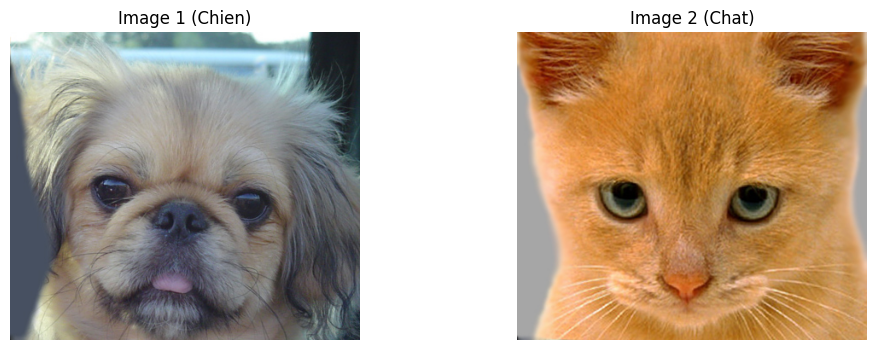

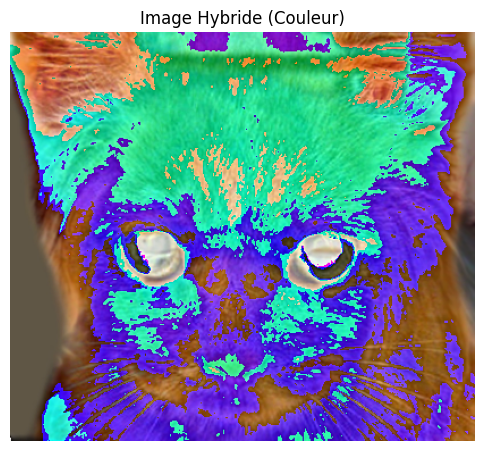

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Charger deux images en couleur depuis des chemins spécifiés
image_path1 = '/content/drive/MyDrive/dataImage/dog.jpg'
image_path2 = '/content/drive/MyDrive/dataImage/cat.jpg'
image1 = cv2.imread(image_path1)
image2 = cv2.imread(image_path2)

# Assurez-vous que les deux images ont la même taille
if image1.shape != image2.shape:
    image2 = cv2.resize(image2, (image1.shape[1], image1.shape[0]))

# Appliquer un filtre passe-bas à l'image 1
kernel_size = 5
blurred_image1 = cv2.GaussianBlur(image1, (kernel_size, kernel_size), 0)

# Soustraire l'image filtrée de l'image 1 de l'image 2
hybrid_image = image2 - blurred_image1

# Afficher les deux images d'origine en couleur
plt.figure(figsize=(12, 4))

plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(image1, cv2.COLOR_BGR2RGB))
plt.title('Image 1 (Chien)')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(image2, cv2.COLOR_BGR2RGB))
plt.title('Image 2 (Chat)')
plt.axis('off')

plt.show()

# Afficher l'image hybride en couleur
plt.figure(figsize=(6, 6))
plt.imshow(cv2.cvtColor(hybrid_image, cv2.COLOR_BGR2RGB))
plt.title('Image Hybride (Couleur)')
plt.axis('off')
plt.show()


In [ ]:
!pip install opencv-python
!pip install click


In [ ]:
cd /content/drive/MyDrive/hybrid-images


/content/drive/MyDrive/hybrid-images


In [ ]:
cd /content/drive/MyDrive/hybrid-images2

/content/drive/MyDrive/hybrid-images2


In [ ]:
!python3 hybrid.py



python3: can't open file '/content/drive/MyDrive/hybrid-images2/hybrid.py': [Errno 2] No such file or directory


In [ ]:
!python3 hybrid.py hybrid /content/drive/MyDrive/hybrid-images/data/cat.bmp /content/drive/MyDrive/hybrid-images/data/dog.bmp -o /content/drive/MyDrive/hybrid-images/output.jpg


python3: can't open file '/content/drive/MyDrive/hybrid-images2/hybrid.py': [Errno 2] No such file or directory


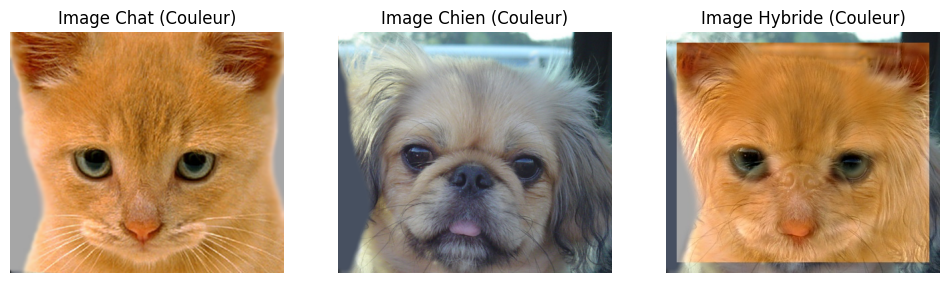

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Chemins complets vers les images
image_cat_path = '/content/drive/MyDrive/hybrid-images/data/cat.bmp'
image_dog_path = '/content/drive/MyDrive/hybrid-images/data/dog.bmp'
hybrid_image_path = '/content/drive/MyDrive/hybrid-images/output.jpg'

# Charger les images
image_cat = cv2.imread(image_cat_path)
image_dog = cv2.imread(image_dog_path)
hybrid_image = cv2.imread(hybrid_image_path)

# Vérifier si les images ont été chargées correctement
if image_cat is not None and image_dog is not None and hybrid_image is not None:
    # Afficher les images
    plt.figure(figsize=(12, 4))

    plt.subplot(1, 3, 1)
    plt.imshow(cv2.cvtColor(image_cat, cv2.COLOR_BGR2RGB))
    plt.title('Image Chat (Couleur)')
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(cv2.cvtColor(image_dog, cv2.COLOR_BGR2RGB))
    plt.title('Image Chien (Couleur)')
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(cv2.cvtColor(hybrid_image, cv2.COLOR_BGR2RGB))
    plt.title('Image Hybride (Couleur)')
    plt.axis('off')

    plt.show()
else:
    print("Une ou plusieurs images n'ont pas été chargées correctement.")


<ipython-input-18-87e8c63a0c67>:32: RuntimeWarning: divide by zero encountered in log
  magnitude_spectrum_lowpass = 20 * np.log(cv2.magnitude(dft_shift_lowpass[:, :, 0], dft_shift_lowpass[:, :, 1]))


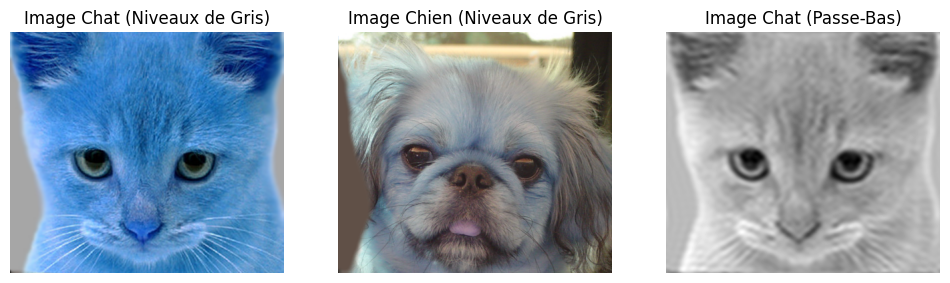

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Définir les chemins des images
image_cat_path = '/content/drive/MyDrive/hybrid-images/data/cat.bmp'
image_dog_path = '/content/drive/MyDrive/hybrid-images/data/dog.bmp'

def apply_low_pass_filter(image, frequency):
    # Convertir l'image en niveaux de gris
    image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Convertir l'image en float32
    image_float32 = image_gray.astype(np.float32)

    # Appliquer la transformée de Fourier sur l'image
    dft = cv2.dft(image_float32, flags=cv2.DFT_COMPLEX_OUTPUT)

    # Transférer le zéro-fréquent au centre de la transformée
    dft_shift = np.fft.fftshift(dft)

    # Créer un masque pour le filtre passe-bas
    rows, cols = image_gray.shape[:2]
    crow, ccol = rows // 2, cols // 2
    mask_lowpass = np.zeros((rows, cols, 2), np.uint8)
    mask_lowpass[crow - frequency:crow + frequency, ccol - frequency:ccol + frequency] = 1

    # Appliquer le masque passe-bas à la transformée de Fourier
    dft_shift_lowpass = dft_shift * mask_lowpass

    # Calculer le spectre de magnitude (magnitude du spectre complexe) du filtre passe-bas
    magnitude_spectrum_lowpass = 20 * np.log(cv2.magnitude(dft_shift_lowpass[:, :, 0], dft_shift_lowpass[:, :, 1]))

    # Appliquer la transformée de Fourier inverse pour obtenir l'image filtrée
    img_back_lowpass = cv2.idft(np.fft.ifftshift(dft_shift_lowpass))

    # Obtenir la composante réelle de l'image inverse
    img_back_lowpass = img_back_lowpass[:, :, 0]

    return magnitude_spectrum_lowpass, img_back_lowpass

# Charger les images chat et chien
image_cat = cv2.imread(image_cat_path)
image_dog = cv2.imread(image_dog_path)

# Vérifier si les images ont été chargées correctement
if image_cat is not None and image_dog is not None:
    # Utilisation du filtre passe-bas
    low_pass_cutoff = 30  # Changer cette valeur si nécessaire
    magnitude_spectrum_lowpass, low_pass_image_cat = apply_low_pass_filter(image_cat, low_pass_cutoff)

    # Afficher les images
    plt.figure(figsize=(12, 4))

    plt.subplot(1, 3, 1)
    plt.imshow(image_cat, cmap='gray')
    plt.title('Image Chat (Niveaux de Gris)')
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(image_dog, cmap='gray')
    plt.title('Image Chien (Niveaux de Gris)')
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(low_pass_image_cat, cmap='gray')
    plt.title('Image Chat (Passe-Bas)')
    plt.axis('off')

    plt.show()
else:
    print("Une ou plusieurs images n'ont pas été chargées correctement.")


<ipython-input-19-7d9499d993f3>:32: RuntimeWarning: divide by zero encountered in log
  magnitude_spectrum_lowpass = 20 * np.log(cv2.magnitude(dft_shift_lowpass[:, :, 0], dft_shift_lowpass[:, :, 1]))


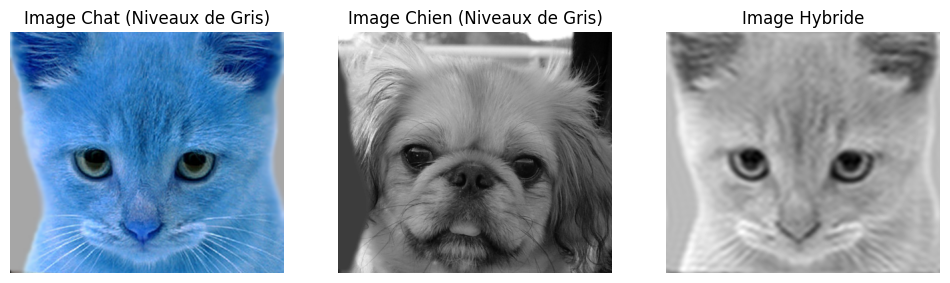

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Définir les chemins des images
image_cat_path = '/content/drive/MyDrive/hybrid-images/data/cat.bmp'
image_dog_path = '/content/drive/MyDrive/hybrid-images/data/dog.bmp'

def apply_low_pass_filter(image, frequency):
    # Convertir l'image en niveaux de gris
    image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Convertir l'image en float32
    image_float32 = image_gray.astype(np.float32)

    # Appliquer la transformée de Fourier sur l'image
    dft = cv2.dft(image_float32, flags=cv2.DFT_COMPLEX_OUTPUT)

    # Transférer le zéro-fréquent au centre de la transformée
    dft_shift = np.fft.fftshift(dft)

    # Créer un masque pour le filtre passe-bas
    rows, cols = image_gray.shape[:2]
    crow, ccol = rows // 2, cols // 2
    mask_lowpass = np.zeros((rows, cols, 2), np.uint8)
    mask_lowpass[crow - frequency:crow + frequency, ccol - frequency:ccol + frequency] = 1

    # Appliquer le masque passe-bas à la transformée de Fourier
    dft_shift_lowpass = dft_shift * mask_lowpass

    # Calculer le spectre de magnitude (magnitude du spectre complexe) du filtre passe-bas
    magnitude_spectrum_lowpass = 20 * np.log(cv2.magnitude(dft_shift_lowpass[:, :, 0], dft_shift_lowpass[:, :, 1]))

    # Appliquer la transformée de Fourier inverse pour obtenir l'image filtrée
    img_back_lowpass = cv2.idft(np.fft.ifftshift(dft_shift_lowpass))

    # Obtenir la composante réelle de l'image inverse
    img_back_lowpass = img_back_lowpass[:, :, 0]

    return magnitude_spectrum_lowpass, img_back_lowpass

# Charger les images chat et chien
image_cat = cv2.imread(image_cat_path)
image_dog = cv2.imread(image_dog_path)

# Vérifier si les images ont été chargées correctement
if image_cat is not None and image_dog is not None:
    # Utilisation du filtre passe-bas
    low_pass_cutoff = 30  # Changer cette valeur si nécessaire
    _, low_pass_image_cat = apply_low_pass_filter(image_cat, low_pass_cutoff)

    # Convertir l'image du chien en niveaux de gris
    image_dog_gray = cv2.cvtColor(image_dog, cv2.COLOR_BGR2GRAY)

    # Assurer que les dimensions des images sont les mêmes
    image_dog_gray = cv2.resize(image_dog_gray, (low_pass_image_cat.shape[1], low_pass_image_cat.shape[0]))

    # Créer l'image hybride en superposant l'image passe-bas du chat et l'image passe-haut du chien
    high_pass_image_dog = image_dog_gray - cv2.GaussianBlur(image_dog_gray, (0, 0), low_pass_cutoff)
    hybrid_image = low_pass_image_cat + high_pass_image_dog

    # Afficher les images
    plt.figure(figsize=(12, 4))

    plt.subplot(1, 3, 1)
    plt.imshow(image_cat, cmap='gray')
    plt.title('Image Chat (Niveaux de Gris)')
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(image_dog_gray, cmap='gray')
    plt.title('Image Chien (Niveaux de Gris)')
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(hybrid_image, cmap='gray')
    plt.title('Image Hybride')
    plt.axis('off')

    plt.show()
else:
    print("Une ou plusieurs images n'ont pas été chargées correctement.")


In [ ]:
!python3 hybrid-images.py

Traceback (most recent call last):
  File "/content/drive/MyDrive/hybrid-images2/hybrid-images.py", line 60, in <module>
    einstein = ndimage.imread("einstein.png", flatten=True)
AttributeError: module 'scipy.ndimage' has no attribute 'imread'


In [ ]:
!python3 hybrid-images.py hybrid-images /content/drive/MyDrive/hybrid-images2/marilyn-einstein.png /content/drive/MyDrive/hybrid-images2/marilyn.png -o /content/drive/MyDrive/hybrid-images2/marilyn-einstein-hybrid-collage.png


Traceback (most recent call last):
  File "/content/drive/MyDrive/hybrid-images2/hybrid-images.py", line 60, in <module>
    einstein = ndimage.imread("einstein.png", flatten=True)
AttributeError: module 'scipy.ndimage' has no attribute 'imread'


In [ ]:
ls /content/drive/MyDrive/hybrid-images2

backwards.png     high-passed-marilyn.png              marilyn.png
dft.png           hybrid-images.py                     README.md
einstein.png      low-passed-marilyn.png               sum-of-marilyns.png
filtered-dft.png  marilyn-einstein-hybrid-collage.png
gaussian2d.png    marilyn-einstein.png


In [ ]:
!pip install opencv-python


In [ ]:
import cv2

# Charger l'image einstein avec OpenCV
einstein = cv2.imread("einstein.png", cv2.IMREAD_GRAYSCALE)


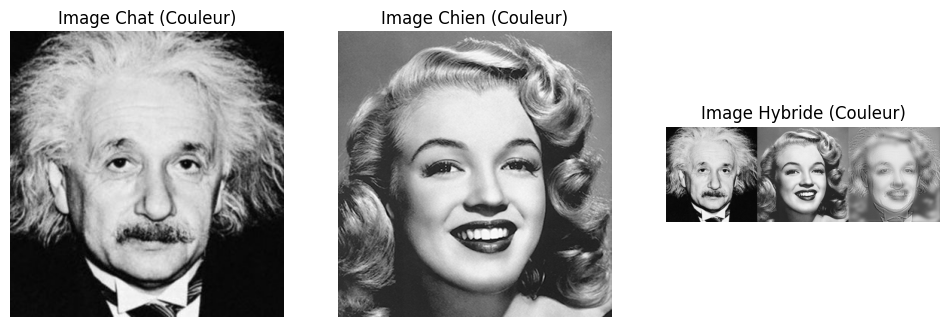

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Chemins complets vers les images
image_cat_path = '/content/drive/MyDrive/hybrid-images2/einstein.png'
image_dog_path = '/content/drive/MyDrive/hybrid-images2/marilyn.png'
hybrid_image_path = '/content/drive/MyDrive/hybrid-images2/marilyn-einstein-hybrid-collage.png'

# Charger les images
image_cat = cv2.imread(image_cat_path)
image_dog = cv2.imread(image_dog_path)
hybrid_image = cv2.imread(hybrid_image_path)

# Vérifier si les images ont été chargées correctement
if image_cat is not None and image_dog is not None and hybrid_image is not None:
    # Afficher les images
    plt.figure(figsize=(12, 4))

    plt.subplot(1, 3, 1)
    plt.imshow(cv2.cvtColor(image_cat, cv2.COLOR_BGR2RGB))
    plt.title('Image Chat (Couleur)')
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(cv2.cvtColor(image_dog, cv2.COLOR_BGR2RGB))
    plt.title('Image Chien (Couleur)')
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(cv2.cvtColor(hybrid_image, cv2.COLOR_BGR2RGB))
    plt.title('Image Hybride (Couleur)')
    plt.axis('off')

    plt.show()
else:
    print("Une ou plusieurs images n'ont pas été chargées correctement.")


<ipython-input-26-25675d1fd80e>:32: RuntimeWarning: divide by zero encountered in log
  magnitude_spectrum_lowpass = 30 * np.log(cv2.magnitude(dft_shift_lowpass[:, :, 0], dft_shift_lowpass[:, :, 1]))


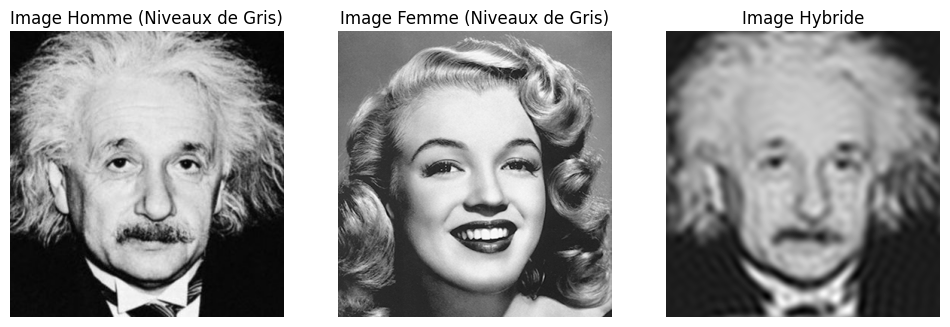

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Définir les chemins des images
image_cat_path = '/content/drive/MyDrive/hybrid-images2/einstein.png'
image_dog_path = '/content/drive/MyDrive/hybrid-images2/marilyn.png'

def apply_low_pass_filter(image, frequency):
    # Convertir l'image en niveaux de gris
    image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Convertir l'image en float32
    image_float32 = image_gray.astype(np.float32)

    # Appliquer la transformée de Fourier sur l'image
    dft = cv2.dft(image_float32, flags=cv2.DFT_COMPLEX_OUTPUT)

    # Transférer le zéro-fréquent au centre de la transformée
    dft_shift = np.fft.fftshift(dft)

    # Créer un masque pour le filtre passe-bas
    rows, cols = image_gray.shape[:2]
    crow, ccol = rows // 2, cols // 2
    mask_lowpass = np.zeros((rows, cols, 2), np.uint8)
    mask_lowpass[crow - frequency:crow + frequency, ccol - frequency:ccol + frequency] = 1

    # Appliquer le masque passe-bas à la transformée de Fourier
    dft_shift_lowpass = dft_shift * mask_lowpass

    # Calculer le spectre de magnitude (magnitude du spectre complexe) du filtre passe-bas
    magnitude_spectrum_lowpass = 30 * np.log(cv2.magnitude(dft_shift_lowpass[:, :, 0], dft_shift_lowpass[:, :, 1]))

    # Appliquer la transformée de Fourier inverse pour obtenir l'image filtrée
    img_back_lowpass = cv2.idft(np.fft.ifftshift(dft_shift_lowpass))

    # Obtenir la composante réelle de l'image inverse
    img_back_lowpass = img_back_lowpass[:, :, 0]

    return magnitude_spectrum_lowpass, img_back_lowpass

# Charger les images chat et chien
image_cat = cv2.imread(image_cat_path)
image_dog = cv2.imread(image_dog_path)

# Vérifier si les images ont été chargées correctement
if image_cat is not None and image_dog is not None:
    # Utilisation du filtre passe-bas
    low_pass_cutoff = 20  # Changer cette valeur si nécessaire
    _, low_pass_image_cat = apply_low_pass_filter(image_cat, low_pass_cutoff)

    # Convertir l'image du chien en niveaux de gris
    image_dog_gray = cv2.cvtColor(image_dog, cv2.COLOR_BGR2GRAY)

    # Assurer que les dimensions des images sont les mêmes
    image_dog_gray = cv2.resize(image_dog_gray, (low_pass_image_cat.shape[1], low_pass_image_cat.shape[0]))

    # Créer l'image hybride en superposant l'image passe-bas du chat et l'image passe-haut du chien
    high_pass_image_dog = image_dog_gray - cv2.GaussianBlur(image_dog_gray, (0, 0), low_pass_cutoff)
    hybrid_image = low_pass_image_cat + high_pass_image_dog

    # Afficher les images
    plt.figure(figsize=(12, 4))

    plt.subplot(1, 3, 1)
    plt.imshow(image_cat, cmap='gray')
    plt.title('Image Homme (Niveaux de Gris)')
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(image_dog_gray, cmap='gray')
    plt.title('Image Femme (Niveaux de Gris)')
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(hybrid_image, cmap='gray')
    plt.title('Image Hybride')
    plt.axis('off')

    plt.show()
else:
    print("Une ou plusieurs images n'ont pas été chargées correctement.")
